# Undertanding Data

In [208]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [209]:
import sklearn.externals as extjoblib
import joblib

In [210]:
from profanity_check import predict, predict_prob

In [211]:
import networkx as nx
import itertools
import os

In [212]:
from collections import Counter

In [213]:
chat = pd.read_csv('./chat_original.csv')

In [214]:
chat.shape

(1439488, 5)

In [17]:
chat.head(30)

,match_id,key,slot,time,unit
0,0,force it,6,-8,6k Slayer
1,0,space created,1,5,Monkey
2,0,hah,1,6,Monkey
3,0,ez 500,6,9,6k Slayer
4,0,mvp ulti,4,934,Kira
5,0,bye,6,1486,6k Slayer
6,0,hah,1,1488,Monkey
7,0,fate,6,1496,6k Slayer
8,0,is cruel,6,1502,6k Slayer
9,0,fuck my ass,0,1524,Double T


In [5]:
chat[['unit', 'match_id']].groupby(by = 'unit').first()

,match_id
unit,
 MGK,35384
!,15468
! Ale<3,34225
! ! ! ! !,156
! #ZjoY,17131
...,...
🔯RayQuaZa^🔯,4301
🔱 @PoC@L!pS!S.ImI💰🚀,12507
😂Q😂U😂E😂E😂N,42719


In [6]:
len(pd.unique(chat['match_id']))

49772

In [7]:
len(pd.unique(chat['unit']))

177992

49772 matches, 177992 players, and 1439488 chat

In [8]:
chat.dtypes

match_id     int64
key         object
slot         int64
time         int64
unit        object
dtype: object

In [9]:
chat.isna().sum()

match_id     0
key         14
slot         0
time         0
unit        42
dtype: int64

In [10]:
chat.dropna(inplace = True)

# EDA HERE

In [7]:
import sklearn.externals as extjoblib
import joblib

In [8]:
from profanity_check import predict, predict_prob

/Users/onekey/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator TfidfTransformer from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/onekey/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator TfidfVectorizer from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/onekey/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LinearSVC from version 1.0.1 when using version 1.0.2. This might lead to 

In [13]:
predict(['chink'])

array([1])

# Network Analysis

### Make it into dataframe - for SNA

In [14]:
chat.head()

,match_id,key,slot,time,unit
0,0,force it,6,-8,6k Slayer
1,0,space created,1,5,Monkey
2,0,hah,1,6,Monkey
3,0,ez 500,6,9,6k Slayer
4,0,mvp ulti,4,934,Kira


In [15]:
chat.loc[chat['match_id'] == 0]

,match_id,key,slot,time,unit
0,0,force it,6,-8,6k Slayer
1,0,space created,1,5,Monkey
2,0,hah,1,6,Monkey
3,0,ez 500,6,9,6k Slayer
4,0,mvp ulti,4,934,Kira
5,0,bye,6,1486,6k Slayer
6,0,hah,1,1488,Monkey
7,0,fate,6,1496,6k Slayer
8,0,is cruel,6,1502,6k Slayer
9,0,fuck my ass,0,1524,Double T


In [16]:
chat.loc[chat['unit'] == 'Monkey']

,match_id,key,slot,time,unit
1,0,space created,1,5,Monkey
2,0,hah,1,6,Monkey
6,0,hah,1,1488,Monkey
11,0,wtf,1,1854,Monkey
12,0,TA?,1,1855,Monkey
...,...,...,...,...,...
1227168,42614,HAVE TUSK? d:,3,2207,Monkey
1227169,42614,D:,3,2210,Monkey
1286977,44670,gg,6,3787,Monkey
1338441,46618,retard ass omni,0,2251,Monkey


In [17]:
chat['pf'] = predict(chat['key'])

In [18]:
chat_prof = chat.loc[(chat['match_id'] == 0) & (chat['pf'] == 1)]

In [19]:
chat_prof

,match_id,key,slot,time,unit,pf
8,0,is cruel,6,1502,6k Slayer,1
9,0,fuck my ass,0,1524,Double T,1
11,0,wtf,1,1854,Monkey,1
23,0,fuck yeah,9,1918,u didnt see who highest here?,1


In [20]:
chat.head()

,match_id,key,slot,time,unit,pf
0,0,force it,6,-8,6k Slayer,0
1,0,space created,1,5,Monkey,0
2,0,hah,1,6,Monkey,0
3,0,ez 500,6,9,6k Slayer,0
4,0,mvp ulti,4,934,Kira,0


In [21]:
df = chat[['unit', 'pf', 'match_id']]

In [22]:
df.head()

,unit,pf,match_id
0,6k Slayer,0,0
1,Monkey,0,0
2,Monkey,0,0
3,6k Slayer,0,0
4,Kira,0,0


In [23]:
df_pf = df.groupby(['match_id', 'unit']).sum()
df_pf.head(20)

pf
match_id unit                             
0        6k Slayer                       1
         Double T                        1
         Kira                            0
         Monkey                          1
         Trash!!!                        0
         u didnt see who highest here?   1
         ｔｏｍｉａ～♥                         0
1        Apin's                          0
         Buk lau                         0
         D o r a                         0
         DA BOSS                         0
         Double T                        0
         Titus                           0
         stormX---                       0
2        Anonymous                       0
         BlackJack                       0
         Grötenelch                      0
         KaLixz                          0
         Star                            0
         WtW|Tweedle Dee & Tweedle Dum   2

In [24]:
df_pf.shape

(303883, 1)

In [25]:
df_n_idx = df_pf.reset_index()

In [26]:
df_n_idx

,match_id,unit,pf
0,0,6k Slayer,1
1,0,Double T,1
2,0,Kira,0
3,0,Monkey,1
4,0,Trash!!!,0
...,...,...,...
303878,49999,DamN.Sakura_Jr,0
303879,49999,Dante,0
303880,49999,PINAGPALA,1
303881,49999,StopDancing,0


In [27]:
df_n_idx['pf'].value_counts(ascending=False)

0     245264
1      38272
2      11188
3       4360
4       1974
5       1062
6        588
7        384
8        224
9        158
10        94
11        81
12        48
13        38
14        36
16        22
15        14
18        13
17         9
19         8
21         7
22         6
20         6
24         6
27         4
25         3
26         3
41         2
38         2
28         2
23         1
32         1
29         1
30         1
35         1
Name: pf, dtype: int64

In [28]:
df_n_idx.shape

(303883, 3)

## Reset Match Id

In [29]:
df_n_idx

,match_id,unit,pf
0,0,6k Slayer,1
1,0,Double T,1
2,0,Kira,0
3,0,Monkey,1
4,0,Trash!!!,0
...,...,...,...
303878,49999,DamN.Sakura_Jr,0
303879,49999,Dante,0
303880,49999,PINAGPALA,1
303881,49999,StopDancing,0


In [30]:
match_id_list = df_n_idx['match_id'].unique()
match_id_list

array([    0,     1,     2, ..., 49997, 49998, 49999])

In [31]:
len(match_id_list)
len_list_id = [x for x in range(0, len(match_id_list))]

In [32]:
len(len_list_id)

49772

In [33]:
res = dict(zip(match_id_list, len_list_id))

In [34]:
df_n_idx['match_id'] = df_n_idx['match_id'].map(res)

In [35]:
df_n_idx

,match_id,unit,pf
0,0,6k Slayer,1
1,0,Double T,1
2,0,Kira,0
3,0,Monkey,1
4,0,Trash!!!,0
...,...,...,...
303878,49771,DamN.Sakura_Jr,0
303879,49771,Dante,0
303880,49771,PINAGPALA,1
303881,49771,StopDancing,0


## Create a new dataframe for SNA

## Initial data for match-id 0

In [36]:
drf = df_n_idx[df_n_idx['match_id'] == 0]

In [37]:
drf

,match_id,unit,pf
0,0,6k Slayer,1
1,0,Double T,1
2,0,Kira,0
3,0,Monkey,1
4,0,Trash!!!,0
5,0,u didnt see who highest here?,1
6,0,ｔｏｍｉａ～♥,0


In [38]:
receiver_0 = drf['unit'].to_list()
receiver_0

['6k Slayer',
 'Double T',
 'Kira',
 'Monkey',
 'Trash!!!',
 'u didnt see who highest here?',
 'ｔｏｍｉａ～♥']

In [39]:
source_0 = drf.loc[drf.pf == 1].unit.to_list()
source_0

['6k Slayer', 'Double T', 'Monkey', 'u didnt see who highest here?']

In [40]:
source_0_list = list(np.repeat(source_0[0], len(receiver_0)))
source_0_list

['6k Slayer',
 '6k Slayer',
 '6k Slayer',
 '6k Slayer',
 '6k Slayer',
 '6k Slayer',
 '6k Slayer']

In [41]:
pd.DataFrame(list(zip(source_0_list, receiver_0)), columns = ['source', 'receiver'])

,source,receiver
0,6k Slayer,6k Slayer
1,6k Slayer,Double T
2,6k Slayer,Kira
3,6k Slayer,Monkey
4,6k Slayer,Trash!!!
5,6k Slayer,u didnt see who highest here?
6,6k Slayer,ｔｏｍｉａ～♥


In [42]:
source_list = []
for source in source_0:
    source_id = list(np.repeat(source, len(receiver_0)))
    source0_list = list(zip(source_id, receiver_0))
    source_list.extend(source0_list)

In [43]:
source_list

[('6k Slayer', '6k Slayer'),
 ('6k Slayer', 'Double T'),
 ('6k Slayer', 'Kira'),
 ('6k Slayer', 'Monkey'),
 ('6k Slayer', 'Trash!!!'),
 ('6k Slayer', 'u didnt see who highest here?'),
 ('6k Slayer', 'ｔｏｍｉａ～♥'),
 ('Double T', '6k Slayer'),
 ('Double T', 'Double T'),
 ('Double T', 'Kira'),
 ('Double T', 'Monkey'),
 ('Double T', 'Trash!!!'),
 ('Double T', 'u didnt see who highest here?'),
 ('Double T', 'ｔｏｍｉａ～♥'),
 ('Monkey', '6k Slayer'),
 ('Monkey', 'Double T'),
 ('Monkey', 'Kira'),
 ('Monkey', 'Monkey'),
 ('Monkey', 'Trash!!!'),
 ('Monkey', 'u didnt see who highest here?'),
 ('Monkey', 'ｔｏｍｉａ～♥'),
 ('u didnt see who highest here?', '6k Slayer'),
 ('u didnt see who highest here?', 'Double T'),
 ('u didnt see who highest here?', 'Kira'),
 ('u didnt see who highest here?', 'Monkey'),
 ('u didnt see who highest here?', 'Trash!!!'),
 ('u didnt see who highest here?', 'u didnt see who highest here?'),
 ('u didnt see who highest here?', 'ｔｏｍｉａ～♥')]

In [44]:
pd.DataFrame(source_list, columns = ['source', 'receiver'])

,source,receiver
0,6k Slayer,6k Slayer
1,6k Slayer,Double T
2,6k Slayer,Kira
3,6k Slayer,Monkey
4,6k Slayer,Trash!!!
5,6k Slayer,u didnt see who highest here?
6,6k Slayer,ｔｏｍｉａ～♥
7,Double T,6k Slayer
8,Double T,Double T
9,Double T,Kira


## Entire loop for all dataset

In [45]:
match_list = df_n_idx['match_id'].unique()
match_list

array([    0,     1,     2, ..., 49769, 49770, 49771])

In [46]:
df_n_idx

,match_id,unit,pf
0,0,6k Slayer,1
1,0,Double T,1
2,0,Kira,0
3,0,Monkey,1
4,0,Trash!!!,0
...,...,...,...
303878,49771,DamN.Sakura_Jr,0
303879,49771,Dante,0
303880,49771,PINAGPALA,1
303881,49771,StopDancing,0


## Function for restructurizing dataframe for SNA: Need source, receiver, and weight

In [47]:
df_draft = []

for match_id in match_list:
    df_by_match_id = df_n_idx[df_n_idx['match_id'] == match_id]
    receiver = df_by_match_id['unit'].to_list()
    source = df_by_match_id.loc[df_by_match_id['pf'] >= 1]['unit'].to_list()
    pf = df_by_match_id.loc[df_by_match_id['pf'] >= 1]['pf'].to_list()
    
    
    if len(source) != 0:
        source_val = list(np.repeat(source, len(receiver)))
        pf_val = list(np.repeat(pf, len(receiver)))
        match_id_val = df_by_match_id['match_id']
        
    source_list = list(zip(source_val, receiver, pf_val, match_id_val))
    df_draft.extend(source_list)


In [48]:
match_id_val

303877    49771
303878    49771
303879    49771
303880    49771
303881    49771
303882    49771
Name: match_id, dtype: int64

In [49]:
df_by_match_id

,match_id,unit,pf
303877,49771,DamN.Pussy_Jr,0
303878,49771,DamN.Sakura_Jr,0
303879,49771,Dante,0
303880,49771,PINAGPALA,1
303881,49771,StopDancing,0
303882,49771,WorstDayOfMyLife^Ever,0


In [50]:
pf_val

[1, 1, 1, 1, 1, 1]

In [51]:
receiver

['DamN.Pussy_Jr',
 'DamN.Sakura_Jr',
 'Dante',
 'PINAGPALA',
 'StopDancing',
 'WorstDayOfMyLife^Ever']

In [52]:
source

['PINAGPALA']

In [53]:
source_val

['PINAGPALA', 'PINAGPALA', 'PINAGPALA', 'PINAGPALA', 'PINAGPALA', 'PINAGPALA']

In [54]:
source_list

[('PINAGPALA', 'DamN.Pussy_Jr', 1, 49771),
 ('PINAGPALA', 'DamN.Sakura_Jr', 1, 49771),
 ('PINAGPALA', 'Dante', 1, 49771),
 ('PINAGPALA', 'PINAGPALA', 1, 49771),
 ('PINAGPALA', 'StopDancing', 1, 49771),
 ('PINAGPALA', 'WorstDayOfMyLife^Ever', 1, 49771)]

In [55]:
df_draft

[('6k Slayer', '6k Slayer', 1, 0),
 ('6k Slayer', 'Double T', 1, 0),
 ('6k Slayer', 'Kira', 1, 0),
 ('6k Slayer', 'Monkey', 1, 0),
 ('6k Slayer', 'Trash!!!', 1, 0),
 ('6k Slayer', 'u didnt see who highest here?', 1, 0),
 ('6k Slayer', 'ｔｏｍｉａ～♥', 1, 0),
 ('6k Slayer', "Apin's", 1, 0),
 ('6k Slayer', 'Buk lau', 1, 0),
 ('6k Slayer', 'D o r a', 1, 0),
 ('6k Slayer', 'DA BOSS', 1, 0),
 ('6k Slayer', 'Double T', 1, 0),
 ('6k Slayer', 'Titus', 1, 0),
 ('6k Slayer', 'stormX---', 1, 0),
 ('WtW|Tweedle Dee & Tweedle Dum', 'Anonymous', 2, 2),
 ('WtW|Tweedle Dee & Tweedle Dum', 'BlackJack', 2, 2),
 ('WtW|Tweedle Dee & Tweedle Dum', 'Grötenelch', 2, 2),
 ('WtW|Tweedle Dee & Tweedle Dum', 'KaLixz', 2, 2),
 ('WtW|Tweedle Dee & Tweedle Dum', 'Star', 2, 2),
 ('WtW|Tweedle Dee & Tweedle Dum', 'WtW|Tweedle Dee & Tweedle Dum', 2, 2),
 ('WtW|Tweedle Dee & Tweedle Dum', 'Ａｌｉｃｅ', 2, 2),
 ('Fuck_Off', 'AresStar®', 1, 3),
 ('Fuck_Off', 'Arhey', 1, 3),
 ('Fuck_Off', 'Arsich', 1, 3),
 ('Fuck_Off', 'Fuck_Off', 1

In [56]:
len(df_draft)

295523

In [57]:
df = pd.DataFrame(df_draft, columns =['source', 'target', 'weight', 'match'])

In [58]:
df

,source,target,weight,match
0,6k Slayer,6k Slayer,1,0
1,6k Slayer,Double T,1,0
2,6k Slayer,Kira,1,0
3,6k Slayer,Monkey,1,0
4,6k Slayer,Trash!!!,1,0
...,...,...,...,...
295518,PINAGPALA,DamN.Sakura_Jr,1,49771
295519,PINAGPALA,Dante,1,49771
295520,PINAGPALA,PINAGPALA,1,49771
295521,PINAGPALA,StopDancing,1,49771


In [59]:
df['weight'].value_counts()

1     201907
2      54190
3      19727
4       8390
5       4735
6       2153
7       1570
8        746
9        521
10       342
11       335
13       217
12       160
14       144
15        60
16        59
21        58
18        33
17        33
20        32
22        29
19        27
27        19
30        15
41        13
25         8
Name: weight, dtype: int64

In [60]:
df.drop_duplicates(subset = ['source', 'target'], inplace = True)


In [61]:
df

,source,target,weight,match
0,6k Slayer,6k Slayer,1,0
1,6k Slayer,Double T,1,0
2,6k Slayer,Kira,1,0
3,6k Slayer,Monkey,1,0
4,6k Slayer,Trash!!!,1,0
...,...,...,...,...
295518,PINAGPALA,DamN.Sakura_Jr,1,49771
295519,PINAGPALA,Dante,1,49771
295520,PINAGPALA,PINAGPALA,1,49771
295521,PINAGPALA,StopDancing,1,49771


In [62]:
df = df.loc[df['source'] != df['target']]

In [63]:
df.shape

(264309, 4)

In [64]:
df

,source,target,weight,match
1,6k Slayer,Double T,1,0
2,6k Slayer,Kira,1,0
3,6k Slayer,Monkey,1,0
4,6k Slayer,Trash!!!,1,0
5,6k Slayer,u didnt see who highest here?,1,0
...,...,...,...,...
295517,PINAGPALA,DamN.Pussy_Jr,1,49771
295518,PINAGPALA,DamN.Sakura_Jr,1,49771
295519,PINAGPALA,Dante,1,49771
295521,PINAGPALA,StopDancing,1,49771


# Select players played more than 10 games

In [65]:
df[['source', 'match']]

,source,match
1,6k Slayer,0
2,6k Slayer,0
3,6k Slayer,0
4,6k Slayer,0
5,6k Slayer,0
...,...,...
295517,PINAGPALA,49771
295518,PINAGPALA,49771
295519,PINAGPALA,49771
295521,PINAGPALA,49771


In [66]:
df[['source', 'match']].drop_duplicates()

,source,match
1,6k Slayer,0
14,WtW|Tweedle Dee & Tweedle Dum,2
21,Fuck_Off,3
33,Xiiao_Hung_,5
49,afroprogger,9
...,...,...
295486,road to ''RIO'',49765
295492,>fAcEdoWn<,49766
295499,CHIKIS,49767
295511,400 Lux,49770


In [67]:
df_val = df[['source', 'match']].drop_duplicates().sort_values(by = 'source')

In [68]:
df_val['source'].value_counts()

...               37
< blank >         36
Deez_Nuts         29
Clueless          27
123               25
                  ..
FFFFF              1
FF.k@w@b@ng@       1
FF.LightSpirit     1
FERSAA VLADAA      1
🙁 trill 🙁          1
Name: source, Length: 24006, dtype: int64

In [69]:
df_id = df_val['source'].value_counts()

In [70]:
high_prof = pd.DataFrame(df_val['source'].value_counts(), columns = ['source', 'count'])

In [71]:
high_prof = high_prof.reset_index()
high_prof

,index,source,count
0,...,37,NaN
1,< blank >,36,NaN
2,Deez_Nuts,29,NaN
3,Clueless,27,NaN
4,123,25,NaN
...,...,...,...
24001,FFFFF,1,NaN
24002,FF.k@w@b@ng@,1,NaN
24003,FF.LightSpirit,1,NaN
24004,FERSAA VLADAA,1,NaN


In [72]:
high_prof.loc[high_prof['source'] > 9]

,index,source,count
0,...,37,NaN
1,< blank >,36,NaN
2,Deez_Nuts,29,NaN
3,Clueless,27,NaN
4,123,25,NaN
5,322,25,NaN
6,Bob Ross,23,NaN
7,Carl,19,NaN
8,.,19,NaN
9,CHI LONG QUA,17,NaN


In [73]:
prof_user = high_prof.index.tolist()
prof_user

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


## Select the ids which are in this list


In [74]:
source_list = df['source'].unique()
len(source_list)

24006

In [75]:
df

,source,target,weight,match
1,6k Slayer,Double T,1,0
2,6k Slayer,Kira,1,0
3,6k Slayer,Monkey,1,0
4,6k Slayer,Trash!!!,1,0
5,6k Slayer,u didnt see who highest here?,1,0
...,...,...,...,...
295517,PINAGPALA,DamN.Pussy_Jr,1,49771
295518,PINAGPALA,DamN.Sakura_Jr,1,49771
295519,PINAGPALA,Dante,1,49771
295521,PINAGPALA,StopDancing,1,49771


In [76]:
df = df.loc[df['source'] != df['target']]

In [77]:
df.shape

(264309, 4)

In [78]:
df_weight = df.loc[df['weight'] > 10]

In [79]:
df_weight

,source,target,weight,match
2241,KeepCalmAndCommendMe :3,Bluecreep,11,365
2243,KeepCalmAndCommendMe :3,Led Zeppelin Glory,11,365
2244,KeepCalmAndCommendMe :3,Malicious Clay Pigeon,11,365
2245,KeepCalmAndCommendMe :3,NORTH,11,365
2246,KeepCalmAndCommendMe :3,Zane,11,365
...,...,...,...,...
294882,DeedleNick,Maye,14,49671
294883,DeedleNick,Try_Harder,14,49671
294884,DeedleNick,WeedMan!,14,49671
294885,DeedleNick,[S][A][U][L][I][T][O],14,49671


In [80]:
df_weight['type'] = 'Directed'

/var/folders/l7/t95q78mn40qcdl5nd054f1nh0000gn/T/ipykernel_4342/789210884.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_weight['type'] = 'Directed'


In [81]:
df_weight

,source,target,weight,match,type
2241,KeepCalmAndCommendMe :3,Bluecreep,11,365,Directed
2243,KeepCalmAndCommendMe :3,Led Zeppelin Glory,11,365,Directed
2244,KeepCalmAndCommendMe :3,Malicious Clay Pigeon,11,365,Directed
2245,KeepCalmAndCommendMe :3,NORTH,11,365,Directed
2246,KeepCalmAndCommendMe :3,Zane,11,365,Directed
...,...,...,...,...,...
294882,DeedleNick,Maye,14,49671,Directed
294883,DeedleNick,Try_Harder,14,49671,Directed
294884,DeedleNick,WeedMan!,14,49671,Directed
294885,DeedleNick,[S][A][U][L][I][T][O],14,49671,Directed


In [83]:
df_weight.to_csv('less_sample_sna.csv', index = False)

In [84]:
G = nx.from_pandas_edgelist(df_weight, source = 'source', target = 'target')

NameError: name 'nx' is not defined

In [ ]:
print(len(G.nodes()))

In [ ]:
import networkx as nx
import itertools
import os

In [ ]:
print(len(G.edges()))

1117


# Degree_centrality

In [ ]:
d_centrality = nx.degree_centrality(G)

In [ ]:
sorted(d_centrality.items(), key = lambda x:x[1], reverse = True)[0:20]

[('He|ìx`', 0.03547854785478548),
 ('I am not a rapper', 0.034653465346534656),
 ('1v9 and i still win', 0.03217821782178218),
 ('Sylla', 0.023102310231023104),
 ('@PariahDota', 0.022277227722772276),
 ('Bleu', 0.019801980198019802),
 ('B-Godz', 0.018976897689768978),
 ('(BIGGER)BIRD', 0.018151815181518153),
 ('CalaeleN', 0.0165016501650165),
 ('Akutober', 0.01485148514851485),
 ('SUMMER-LOVE', 0.01485148514851485),
 ('KeepCalmAndCommendMe :3', 0.014026402640264026),
 ('<3 mohad_baqir <3', 0.014026402640264026),
 ('Psycho', 0.013201320132013201),
 ('Jeef', 0.013201320132013201),
 (':(', 0.012376237623762377),
 ('David K', 0.012376237623762377),
 ('1) Lose MMR 2) Get low priority', 0.012376237623762377),
 ('Mortal Vengeance', 0.011551155115511552),
 ('Bushi', 0.011551155115511552)]

#  Pagerank

In [ ]:
pagerank = nx.pagerank(G)

In [ ]:
sorted(pagerank.items(), key = lambda x:x[1], reverse = True)[0:20]

[('He|ìx`', 0.01674374317503006),
 ('I am not a rapper', 0.016364711249632364),
 ('1v9 and i still win', 0.01522761547343926),
 ('Sylla', 0.010903096724491723),
 ('@PariahDota', 0.010679232368666788),
 ('Bleu', 0.00935223009402124),
 ('B-Godz', 0.009163104667075967),
 ('(BIGGER)BIRD', 0.008626039744982092),
 ('CalaeleN', 0.008026008890882862),
 ('Akutober', 0.007267945040087443),
 ('SUMMER-LOVE', 0.007267945040087443),
 ('KeepCalmAndCommendMe :3', 0.006888913114689739),
 ('<3 mohad_baqir <3', 0.006692908277278929),
 ('Psycho', 0.00650988118929204),
 ('Jeef', 0.006313643809046746),
 (':(', 0.006130849263894329),
 ('David K', 0.006130849263894329),
 ('1) Lose MMR 2) Get low priority', 0.006130849263894329),
 ('Bushi', 0.005751817338496627),
 ('Nyxilog', 0.005751817338496627)]

## Betweenness Centrality (Hub/Nodes)

k = 1 (2.6s)

In [ ]:
b_centrality = nx.betweenness_centrality(G, k = 1)

K = 2 (5.3s)

In [ ]:
b_centrality = nx.betweenness_centrality(G, k = 10)

In [ ]:
sorted(b_centrality.items(), key = lambda x:x[1], reverse = True)[0:20]

[('HULK', 0.0021487574025775822),
 ('< blank >', 0.0014049567632238038),
 (':(', 0.0011570232167725444),
 ('Ange De La Mort 전문가', 0.0010743787012887911),
 ('360 no scope', 0.000991734185805038),
 ('[UH]TaRaNtuLa', 0.000991734185805038),
 ('Counter Terrorist Wins', 0.0008264451548375317),
 ('No Miracles...!', 0.0008264451548375317),
 ('SuncuT', 0.0008264451548375317),
 ('EZ AIDZ', 0.0005785116083862722),
 ('tehdilgerer', 0.00041322257741876583),
 ('! O', 0.00041322257741876583),
 ('DAMO AND DARREN', 0.00033057806193501267),
 ('KeepCalmAndCommendMe :3', 0.0),
 ('Bluecreep', 0.0),
 ('Led Zeppelin Glory', 0.0),
 ('Malicious Clay Pigeon', 0.0),
 ('NORTH', 0.0),
 ('Zane', 0.0),
 ('joker', 0.0)]

# Visualization

In [ ]:
g = nx.Graph()

In [ ]:
g = nx.from_pandas_edgelist(df_weight, source = 'source', target = 'target')

In [ ]:
print(nx.info(g))

Graph with 1213 nodes and 1117 edges


In [ ]:
plt.figure(figsize=(20,20))

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [ ]:
pos = nx.spring_layout(g, k = 0.15)

# Working here

In [1]:
df_n_idx.to_csv('initial_dataframe.csv', index = False)

NameError: name 'df_n_idx' is not defined

# Load df_n_idx 

In [215]:
df_n_idx = pd.read_csv('initial_dataframe.csv')

In [216]:
df_n_idx

,match_id,unit,pf
0,0,6k Slayer,1
1,0,Double T,1
2,0,Kira,0
3,0,Monkey,1
4,0,Trash!!!,0
...,...,...,...
303878,49771,DamN.Sakura_Jr,0
303879,49771,Dante,0
303880,49771,PINAGPALA,1
303881,49771,StopDancing,0


In [217]:
df_n_idx.loc[df_n_idx['match_id'] == 0]

,match_id,unit,pf
0,0,6k Slayer,1
1,0,Double T,1
2,0,Kira,0
3,0,Monkey,1
4,0,Trash!!!,0
5,0,u didnt see who highest here?,1
6,0,ｔｏｍｉａ～♥,0


In [218]:
df_n_idx[['unit', 'pf']].groupby('unit').sum().sort_values(by = 'pf', ascending=False)

,pf
unit,
Deez_Nuts,207
He|ìx`,135
Miley,117
Clueless,88
David K,83
...,...
Last Link,0
Last Memories ^_^,0
Last One Standing,0


In [227]:
chat.loc[chat['unit'] == 'Deez_Nuts']

,match_id,key,slot,time,unit
16444,513,ty,8,376,Deez_Nuts
16445,513,fv is useless,8,379,Deez_Nuts
16447,513,ty i commend you too,8,391,Deez_Nuts
16454,513,lol wp,8,2295,Deez_Nuts
16457,513,im so sorry,8,2323,Deez_Nuts
...,...,...,...,...,...
1433748,49804,ez monies,5,745,Deez_Nuts
1433749,49804,gtfo of my jugnle,5,891,Deez_Nuts
1433756,49804,?,5,1956,Deez_Nuts
1433766,49804,ok i unpuase now me no english,5,1956,Deez_Nuts


# Frequently played player stats - 5/9/2022

In [236]:
df_n_idx

,match_id,unit,pf
0,0,6k Slayer,1
1,0,Double T,1
2,0,Kira,0
3,0,Monkey,1
4,0,Trash!!!,0
...,...,...,...
303878,49771,DamN.Sakura_Jr,0
303879,49771,Dante,0
303880,49771,PINAGPALA,1
303881,49771,StopDancing,0


In [237]:
from collections import Counter

In [238]:
id_count = Counter(df_n_idx['unit'])

In [239]:
id_count

Counter({'6k Slayer': 1,
         'Double T': 2,
         'Kira': 25,
         'Monkey': 12,
         'Trash!!!': 1,
         'u didnt see who highest here?': 1,
         'ｔｏｍｉａ～♥': 1,
         "Apin's": 1,
         'Buk lau': 1,
         'D o r a': 1,
         'DA BOSS': 3,
         'Titus': 7,
         'stormX---': 1,
         'Anonymous': 30,
         'BlackJack': 3,
         'Grötenelch': 1,
         'KaLixz': 1,
         'Star': 4,
         'WtW|Tweedle Dee & Tweedle Dum': 1,
         'Ａｌｉｃｅ': 1,
         'AresStar®': 1,
         'Arhey': 1,
         'Arsich': 1,
         'Fuck_Off': 4,
         'Matt': 21,
         'Porucznik Ku®wa': 5,
         'ahohuhahohu': 1,
         '¡No pasarán!': 1,
         'Desolation': 5,
         'FREAKGANG.haa': 1,
         'SIMBA': 1,
         'iceiceBABE': 1,
         '$uƒfer': 2,
         'Xiiao_Hung_': 2,
         'stadin.xxx': 1,
         'Ｌｕｉｓ': 2,
         'Faint': 2,
         'Jim Jim': 1,
         'Ravenclaw': 2,
         'qwewqewqewqewq': 1

In [240]:
count_by_id = pd.DataFrame.from_dict(id_count, orient = 'index', columns = ['count']).reset_index()
count_by_id

,index,count
0,6k Slayer,1
1,Double T,2
2,Kira,25
3,Monkey,12
4,Trash!!!,1
...,...,...
177985,kabutee,1
177986,DamN.Pussy_Jr,1
177987,DamN.Sakura_Jr,1
177988,PINAGPALA,1


In [241]:
count_by_id.sort_values(by = 'count', ascending = False)

,index,count
1101,< blank >,202
3192,...,188
1233,123,170
341,Saitama,113
4746,.,110
...,...,...
77066,enerGy.,1
77065,[ß]ĭļļ —» xÐ ♥ ҉҈҉,1
77064,[TYR]SurpriseMotherfucker !!,1
77061,...[PSI] DroguercitO Ψ,1


In [242]:
freq_user_df = count_by_id.loc[count_by_id['count'] > 9]
freq_user_df

,index,count
2,Kira,25
3,Monkey,12
13,Anonymous,30
24,Matt,21
45,melissachan♥,11
...,...,...
135655,[V].Trying to walk away,11
136991,Marble Soda,11
137981,WooCash,10
143755,RunAway,10


In [243]:
freq_user_id = freq_user_df['index'].tolist()
freq_user_id

['Kira',
 'Monkey',
 'Anonymous',
 'Matt',
 'melissachan♥',
 'Kenny',
 'Doug Carl',
 'KingJonesGaming',
 'Max Tryhard',
 'bourgeoisie',
 'Joe',
 'Hades',
 'ебать',
 'Mithrandir',
 'AA',
 'Bruce Wayne',
 '†',
 'Kai',
 'cK.1',
 'shibui',
 'Maiku Mori',
 'ALWAYSWANNADIE',
 'GGWP',
 'BrianCooper1',
 'Kappa',
 'Bob Ross',
 'Audible Chocolate',
 'Saitama',
 '+25',
 'Fiddler',
 'Karl',
 'Light',
 'carry please ty',
 '???',
 'Banana',
 'Style',
 'Zzz',
 '?????',
 'Ez',
 'Miracle-',
 'Tiny Rick',
 'Syndrome',
 'Vern Vandamn',
 '4Head',
 '『\u3000\u3000』',
 'O.o',
 'REvo.f',
 'The Boy',
 'Doro',
 'KauppaneuvosFiti',
 'Lurgo',
 'Jesus',
 'Statick',
 'Rick',
 'Bob',
 'Tom Ganks',
 'Boss',
 'Flower',
 'Nero',
 'Louis Litt',
 'Sn0_Man',
 "What's Poppin'",
 'Player',
 'Eagle',
 'Falcon',
 'Caped Baldy',
 'XIII',
 '^_^',
 'D',
 'Captain Adorable',
 '=)',
 'KITTY HAS TO GO',
 'Pourosis',
 '????',
 'Ace',
 'Nate Higgers',
 'confessor',
 'grillz',
 '._.',
 'feeder',
 'light orange',
 'Axosh',
 '<><',
 'sn

In [244]:
chat_freq = chat[chat['unit'].isin(freq_user_id)]

### Dataframe with players played more than 10 times

In [245]:
chat_freq

,match_id,key,slot,time,unit
1,0,space created,1,5,Monkey
2,0,hah,1,6,Monkey
4,0,mvp ulti,4,934,Kira
6,0,hah,1,1488,Monkey
11,0,wtf,1,1854,Monkey
...,...,...,...,...,...
1439442,49998,LOLOL,7,2208,400 Lux
1439447,49998,exz,7,2219,400 Lux
1439449,49998,cant even type,7,2222,400 Lux
1439450,49998,dumbass,7,2225,400 Lux


In [246]:
chat_freq.nunique()

match_id     26534
key         104660
slot            10
time          5059
unit          2197
dtype: int64

### Profanity Check

In [247]:
chat_freq.isnull().sum()

match_id    0
key         1
slot        0
time        0
unit        0
dtype: int64

In [248]:
chat_freq.dropna(inplace=True)

/var/folders/l7/t95q78mn40qcdl5nd054f1nh0000gn/T/ipykernel_6275/838514748.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chat_freq.dropna(inplace=True)


In [249]:
chat_freq['pf'] = predict(chat_freq['key'])

/var/folders/l7/t95q78mn40qcdl5nd054f1nh0000gn/T/ipykernel_6275/2839387911.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chat_freq['pf'] = predict(chat_freq['key'])


In [250]:
chat_freq

,match_id,key,slot,time,unit,pf
1,0,space created,1,5,Monkey,0
2,0,hah,1,6,Monkey,0
4,0,mvp ulti,4,934,Kira,0
6,0,hah,1,1488,Monkey,0
11,0,wtf,1,1854,Monkey,1
...,...,...,...,...,...,...
1439442,49998,LOLOL,7,2208,400 Lux,0
1439447,49998,exz,7,2219,400 Lux,0
1439449,49998,cant even type,7,2222,400 Lux,0
1439450,49998,dumbass,7,2225,400 Lux,1


### Replace match_id with unique values

In [251]:
chat_freq['match_id'].nunique()

26534

In [252]:
unique_match_id = list(range(chat_freq['match_id'].nunique()))
len(unique_match_id)

26534

In [312]:
freq_id_match_list = list(chat_freq['match_id'].drop_duplicates())
freq_id_match_list

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [313]:
len(list(freq_id_match_list))

26534

In [255]:
res = dict(zip(freq_id_match_list, unique_match_id))

In [256]:
chat_freq['match_id'] = chat_freq['match_id'].map(res)

/var/folders/l7/t95q78mn40qcdl5nd054f1nh0000gn/T/ipykernel_6275/2898279501.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chat_freq['match_id'] = chat_freq['match_id'].map(res)


In [257]:
chat_freq

,match_id,key,slot,time,unit,pf
1,0,space created,1,5,Monkey,0
2,0,hah,1,6,Monkey,0
4,0,mvp ulti,4,934,Kira,0
6,0,hah,1,1488,Monkey,0
11,0,wtf,1,1854,Monkey,1
...,...,...,...,...,...,...
1439442,26532,LOLOL,7,2208,400 Lux,0
1439447,26532,exz,7,2219,400 Lux,0
1439449,26532,cant even type,7,2222,400 Lux,0
1439450,26532,dumbass,7,2225,400 Lux,1


## Entire loop for all dataset

In [258]:
freq_match_list = chat_freq['match_id'].unique()
freq_match_list

array([    0,     1,     2, ..., 26531, 26532, 26533])

In [259]:
chat_freq

,match_id,key,slot,time,unit,pf
1,0,space created,1,5,Monkey,0
2,0,hah,1,6,Monkey,0
4,0,mvp ulti,4,934,Kira,0
6,0,hah,1,1488,Monkey,0
11,0,wtf,1,1854,Monkey,1
...,...,...,...,...,...,...
1439442,26532,LOLOL,7,2208,400 Lux,0
1439447,26532,exz,7,2219,400 Lux,0
1439449,26532,cant even type,7,2222,400 Lux,0
1439450,26532,dumbass,7,2225,400 Lux,1


In [295]:
chat_freq.head(40)

,match_id,key,slot,time,unit,pf
1,0,space created,1,5,Monkey,0
2,0,hah,1,6,Monkey,0
4,0,mvp ulti,4,934,Kira,0
6,0,hah,1,1488,Monkey,0
11,0,wtf,1,1854,Monkey,1
12,0,TA?,1,1855,Monkey,0
13,0,u srsly?,1,1857,Monkey,0
18,0,why alyway hit me,1,1905,Monkey,0
19,0,what did i do,1,1909,Monkey,0
24,0,.l.,1,1919,Monkey,0


In [261]:
match_list = chat_freq['match_id'].unique()
match_list

array([    0,     1,     2, ..., 26531, 26532, 26533])

In [262]:
chat_freq

,match_id,key,slot,time,unit,pf
1,0,space created,1,5,Monkey,0
2,0,hah,1,6,Monkey,0
4,0,mvp ulti,4,934,Kira,0
6,0,hah,1,1488,Monkey,0
11,0,wtf,1,1854,Monkey,1
...,...,...,...,...,...,...
1439442,26532,LOLOL,7,2208,400 Lux,0
1439447,26532,exz,7,2219,400 Lux,0
1439449,26532,cant even type,7,2222,400 Lux,0
1439450,26532,dumbass,7,2225,400 Lux,1


In [263]:
df_freq = chat_freq[['unit', 'pf', 'match_id', 'time']]
df_freq

,unit,pf,match_id,time
1,Monkey,0,0,5
2,Monkey,0,0,6
4,Kira,0,0,934
6,Monkey,0,0,1488
11,Monkey,1,0,1854
...,...,...,...,...
1439442,400 Lux,0,26532,2208
1439447,400 Lux,0,26532,2219
1439449,400 Lux,0,26532,2222
1439450,400 Lux,1,26532,2225


In [264]:
df_freq = df_freq.groupby(['match_id', 'unit']).sum()
df_freq.head(20)

pf   time
match_id unit                      
0        Kira              0    934
         Monkey            1  27882
1        Anonymous         0   2707
2        Matt              0   3081
3        melissachan♥      0  11747
4        Kenny             0   2014
5        Doug Carl         0   9335
6        KingJonesGaming   0   4009
         Max Tryhard       0   3996
         bourgeoisie       1  10221
7        Joe               2   9327
8        Hades             0   3761
9        ебать             0   5363
10       melissachan♥      0  23561
11       Mithrandir        0   2930
12       AA                0   1752
         Bruce Wayne       0   1605
13       †                 0    545
14       Kai               0   3401
         cK.1              0  30787

In [265]:
df_freq.shape

(36083, 2)

In [266]:
df_freq = df_freq.reset_index()

In [267]:
df_freq

,match_id,unit,pf,time
0,0,Kira,0,934
1,0,Monkey,1,27882
2,1,Anonymous,0,2707
3,2,Matt,0,3081
4,3,melissachan♥,0,11747
...,...,...,...,...
36078,26530,Anonymous,0,5280
36079,26531,Madao,0,18176
36080,26531,StoopidVarrior,0,1866
36081,26532,400 Lux,2,14211


## Function for restructurizing dataframe for SNA: Need source, receiver, and weight

In [268]:
df_by_match_id = df_freq[df_freq['match_id'] == 0]
df_by_match_id

,match_id,unit,pf,time
0,0,Kira,0,934
1,0,Monkey,1,27882


In [269]:
receiver = df_by_match_id['unit'].to_list()
receiver

['Kira', 'Monkey']

In [270]:
source = df_by_match_id.loc[df_by_match_id['pf'] >= 1]['unit'].to_list()
source

['Monkey']

In [271]:
pf = df_by_match_id.loc[df_by_match_id['pf'] >= 1]['pf'].to_list()
pf

[1]

In [274]:
source_val = list(np.repeat(source, len(receiver)))
pf_val = list(np.repeat(pf, len(receiver)))
match_id_val = df_by_match_id['match_id']
match_id_val


0    0
1    0
Name: match_id, dtype: int64

In [275]:
source_list = list(zip(source_val, receiver, pf_val, match_id_val))
source_list

[('Monkey', 'Kira', 1, 0), ('Monkey', 'Monkey', 1, 0)]

In [284]:
match_list

array([    0,     1,     2, ..., 26531, 26532, 26533])

In [389]:
df_freq_draft = []

for match_id in freq_id_match_list:
    df_by_match_id = df_freq[df_freq['match_id'] == match_id]
    receiver = df_by_match_id['unit'].to_list()
    source = df_by_match_id.loc[df_by_match_id['pf'] >= 1]['unit']
    pf = df_by_match_id.loc[df_by_match_id['pf'] >= 1]['pf']
    match_id_val = df_by_match_id['match_id']

    
    
    if len(df_by_match_id) != 0:
        source_val = list(np.repeat(source, len(receiver)))
        pf_val = list(np.repeat(pf, len(receiver)))

    source_list = list(zip(source_val, receiver, pf_val, match_id_val))
    
    df_freq_draft.extend(source_list)


In [392]:
freq_user_df = pd.DataFrame(df_freq_draft, columns = ['source', 'target', 'weight', 'match'])
freq_user_df

,source,target,weight,match
0,Monkey,Kira,1,0
1,Monkey,Monkey,1,0
2,bourgeoisie,KingJonesGaming,1,6
3,bourgeoisie,Max Tryhard,1,6
4,bourgeoisie,bourgeoisie,1,6
...,...,...,...,...
11623,[THG]Executer26th,[THG]Executer26th,1,26509
11624,Hakuna Matata,Hakuna Matata,1,26516
11625,Hakuna Matata,Soffish,1,26516
11626,Windalfr,Windalfr,2,26529


In [393]:
freq_user_df = freq_user_df.loc[freq_user_df['source']!= freq_user_df['target']]

In [394]:
freq_user_df

,source,target,weight,match
0,Monkey,Kira,1,0
2,bourgeoisie,KingJonesGaming,1,6
3,bourgeoisie,Max Tryhard,1,6
11,^_^,Caped Baldy,2,65
12,^_^,XIII,2,65
...,...,...,...,...
11613,Carl,Snipe Desu~,1,26480
11615,JJ,Skye,9,26484
11621,[THG]Executer26th,BG,1,26509
11622,[THG]Executer26th,XIII,1,26509


In [395]:
freq_user_df['type'] = 'Directed'

/var/folders/l7/t95q78mn40qcdl5nd054f1nh0000gn/T/ipykernel_6275/2688211194.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  freq_user_df['type'] = 'Directed'


In [396]:
len(freq_user_df['match'].unique())

3238

In [397]:
freq_user_df.to_csv('freq_user_sna.csv', index = False)

## Social Network Analysis - Directed

In [439]:
import gzip
import re

# Ignore any warnings related to downloading shpfiles with cartopy
import warnings

warnings.simplefilter("ignore")

In [404]:
directed_G_1 = nx.DiGraph()

In [408]:
directed_G_1.add_nodes_from(list(set(freq_user_df.source).union(set(freq_user_df.target))))

In [423]:
directed_G_1.add_edge('Monkey', 'Kira', weight = 1)

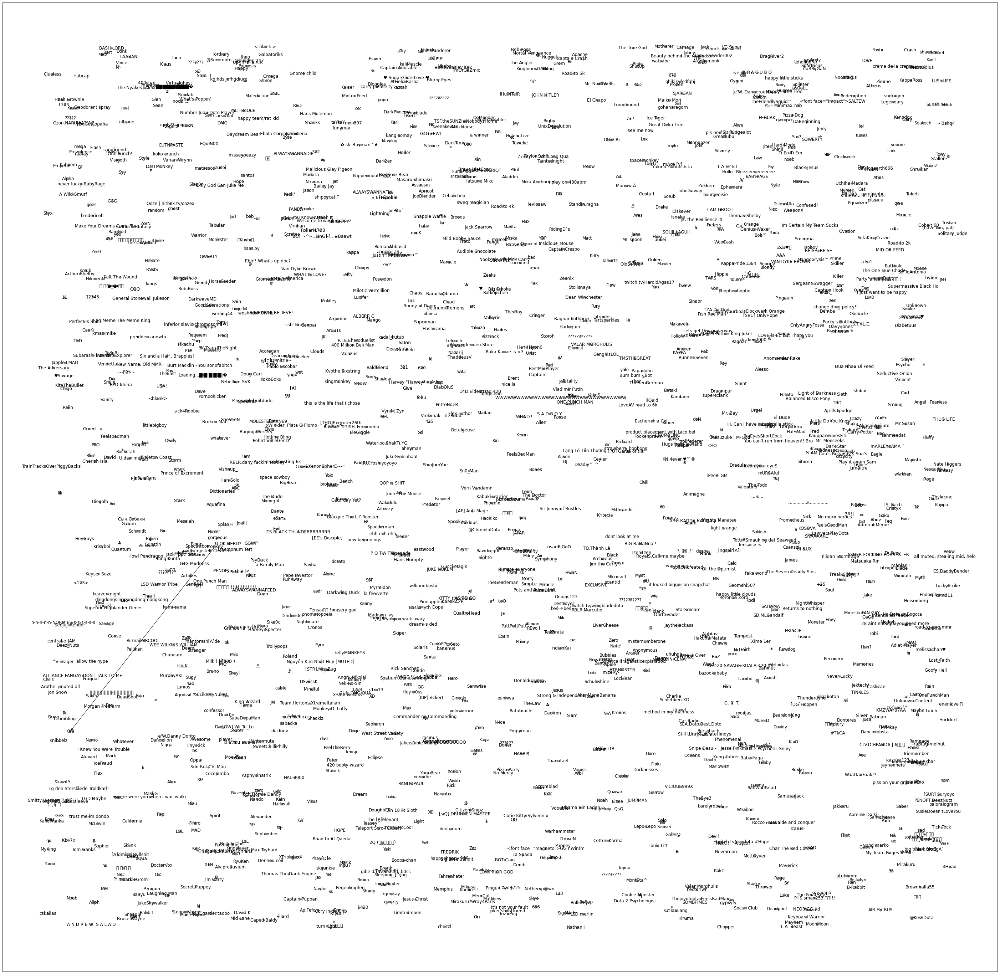

In [440]:
plt.figure(figsize=(50, 50))
pos = nx.random_layout(directed_G_1)
nx.draw_networkx(directed_G_1, pos, node_size = 25, node_color = 'grey')
plt.show()

### After all matches

In [462]:
directed_G = nx.MultiDiGraph()

In [463]:
directed_G = nx.from_pandas_edgelist(freq_user_df, source = 'source', target = 'target')

In [464]:
print(nx.info(directed_G))

Graph with 1924 nodes and 3436 edges


In [465]:
directed_G

In [466]:
import math

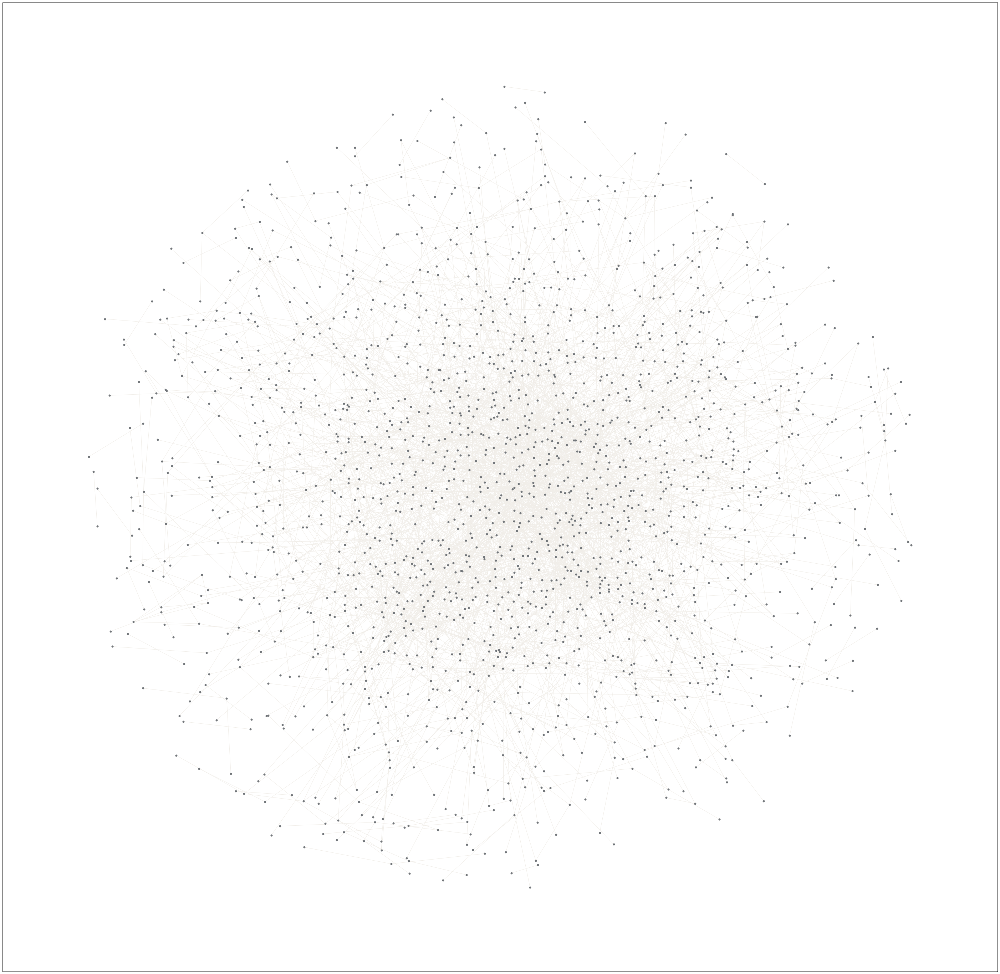

In [467]:
plt.figure(figsize=(50, 50))
pos = nx.spring_layout(directed_G, k=5/math.sqrt(directed_G.order()))
nx.draw_networkx(directed_G, pos, node_size = 25, node_color = '#73777B', with_labels = False, edge_color = '#F1EEE9')
plt.show()

In [468]:
directed_G.add_edge('Monkey', 'Kira', weight = 1, color = '#FF4949')

In [469]:
directed_G.edges('Monkey', 'Kira')

EdgeDataView([('Monkey', 'Kira', None), ('Monkey', 'vndragon', None)])

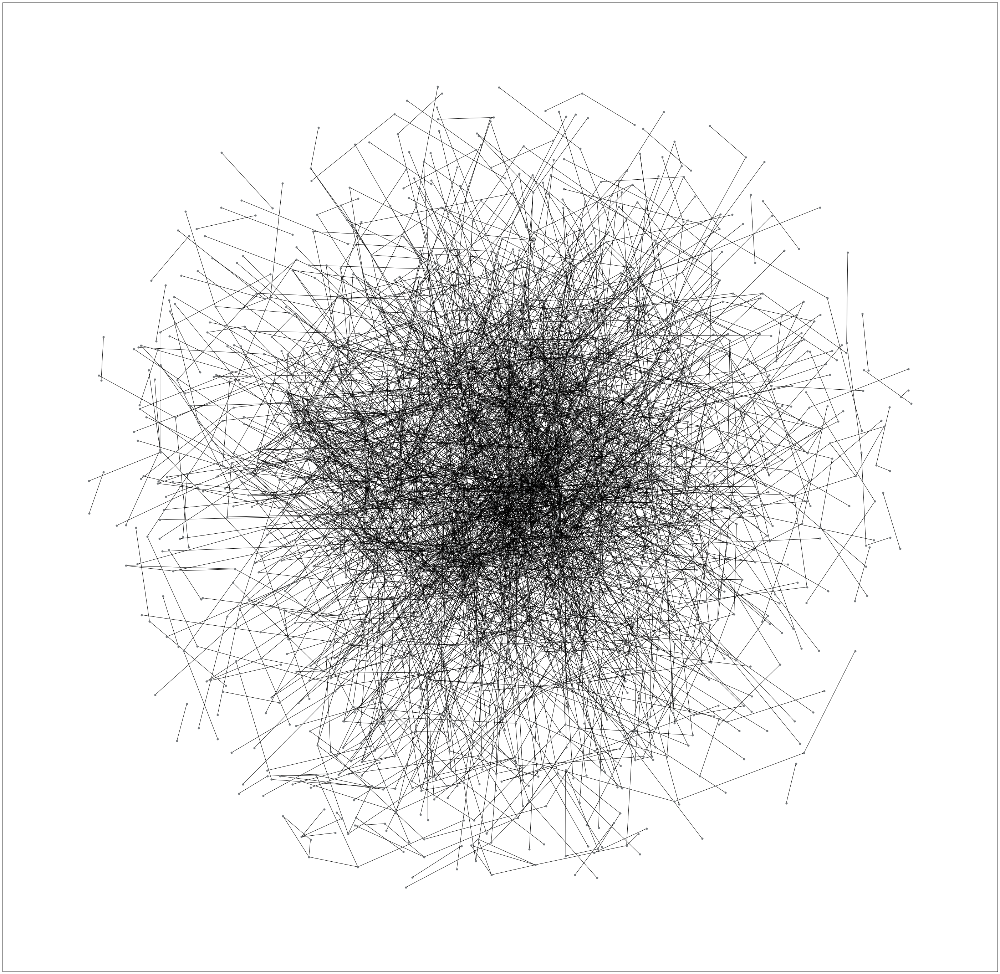

In [471]:
plt.figure(figsize=(50, 50))
pos = nx.spring_layout(directed_G, k=5/math.sqrt(directed_G.order()))
nx.draw_networkx(directed_G, pos, node_size = 25, node_color = '#73777B', with_labels = False)
directed_G.add_edge('Monkey', 'Kira', weight = 1, color = '#FF4949')
plt.show()

In [523]:
freq_user_df

,source,target,weight,match,type
0,Monkey,Kira,1,0,Directed
2,bourgeoisie,KingJonesGaming,1,6,Directed
3,bourgeoisie,Max Tryhard,1,6,Directed
11,^_^,Caped Baldy,2,65,Directed
12,^_^,XIII,2,65,Directed
...,...,...,...,...,...
11613,Carl,Snipe Desu~,1,26480,Directed
11615,JJ,Skye,9,26484,Directed
11621,[THG]Executer26th,BG,1,26509,Directed
11622,[THG]Executer26th,XIII,1,26509,Directed


In [524]:
freq_user_df.to_csv('freq_user_updated.csv', index = False)

In [145]:
from pyvis.network import Network

In [146]:
net = Network()

In [147]:
players = list(set(freq_user_df.source).union(set(freq_user_df.target)))

In [149]:
players

['Give',
 'Diabetuus',
 'Alien',
 'ZorN',
 'Arakus',
 'Atlas',
 '2grills1pudge',
 'Wintermute',
 'Angry Nikolai',
 'The Adversary',
 'Prince of Excrement',
 'Admiral Meme',
 'Baldfriend',
 'w/e',
 'shauder',
 's_callahan2',
 'BG',
 'fensji',
 'Assassin',
 'Road to Al-Qaeda',
 'Ahov',
 'Gamut',
 'Quantum',
 'Captain Puppan',
 'HalF.Mad',
 'rngod',
 'MaskGT',
 'melissachan♥',
 'Jiten',
 'little baobao',
 'Hotline Bling',
 'cocodino',
 'Butthole',
 'Kpkz',
 'sigur',
 'qqq',
 'KITTY HAS TO GO',
 'Toomel',
 'Vincent',
 'SharkieGrom',
 'A0',
 'Aquafina',
 '111',
 'Silver',
 'KutTaoLang',
 'santos',
 'WTF',
 'Monkey D. Luffy',
 'Ameb',
 'Rampage',
 'SoNNeikOOOOO!!!!!!!',
 'Stromblad',
 'G4G.Madness',
 'Silent',
 'Natsu',
 'Bar[CE]',
 'romanicky',
 'BOSS',
 'Viridian',
 'CDEC.garder.taobo',
 'Captain Cra$h',
 'Flow',
 'OMG! U still believe in LOVE???',
 '~rabtug-molhut',
 '????',
 'Craawks',
 'XTripleJaxX',
 'Pika',
 'Sweet TittyMo',
 'Hezbollah',
 '123',
 'XD',
 'blank',
 'Achilles',
 'Destin

In [151]:
player_net = Network(notebook=True)
player_net.add_nodes(players)

In [164]:
players_list = freq_user_df[['source', 'target']].values.tolist()
players_list

[['Monkey', 'Kira'],
 ['Monkey', 'Anonymous'],
 ['Monkey', 'Matt'],
 ['Monkey', 'melissachan♥'],
 ['Monkey', 'Kenny'],
 ['Monkey', 'Doug Carl'],
 ['bourgeoisie', 'KingJonesGaming'],
 ['bourgeoisie', 'Max Tryhard'],
 ['Joe', 'Hades'],
 ['Joe', 'ебать'],
 ['Joe', 'melissachan♥'],
 ['Joe', 'Mithrandir'],
 ['Joe', 'AA'],
 ['Joe', '†'],
 ['Joe', 'Kai'],
 ['Joe', 'Maiku Mori'],
 ['Joe', 'ALWAYSWANNADIE'],
 ['Joe', 'BrianCooper1'],
 ['Kappa', 'Bob Ross'],
 ['Kappa', 'Audible Chocolate'],
 ['Kappa', 'melissachan♥'],
 ['Kappa', 'melissachan♥'],
 ['Kappa', 'melissachan♥'],
 ['Kappa', 'melissachan♥'],
 ['Kappa', 'Saitama'],
 ['Kappa', '+25'],
 ['Kappa', 'Fiddler'],
 ['Kappa', 'Karl'],
 ['Kappa', 'Light'],
 ['Kappa', 'carry please ty'],
 ['Kappa', 'carry please ty'],
 ['Kappa', 'Fiddler'],
 ['Kappa', '???'],
 ['Kappa', 'Style'],
 ['Kappa', 'Audible Chocolate'],
 ['Kappa', 'Zzz'],
 ['Kappa', '?????'],
 ['Kappa', 'Tiny Rick'],
 ['Kappa', 'Syndrome'],
 ['Kappa', 'Vern Vandamn'],
 ['4Head', 'melissach

In [165]:
player_net.add_edges(players)

AssertionError: non existent node 'i'